In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf

from PIL import Image, ImageOps
import xml.etree.ElementTree as ET
from keras.callbacks import LearningRateScheduler

from keras.models import Model
from keras.layers import Input, Dense, Reshape, Conv2D, Flatten, UpSampling2D, concatenate
from keras.optimizers import Adam

from keras.layers import Input, Dense, Reshape, Conv2D, Flatten, concatenate, UpSampling2D
from keras.models import Model

from skimage.transform import resize

from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image
from scipy.linalg import sqrtm
import numpy as np
import os

from scipy.stats import entropy
from tqdm import tqdm

%matplotlib inline


2024-05-13 19:19:59.936648: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-13 19:19:59.936711: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-13 19:19:59.938406: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
computelb = True
dogsonly = True
path = "/kaggle/input/generative-dog-images/" if computelb else "/kaggle/input/"
image_path = path + "all-dogs/all-dogs/" if dogsonly else path
breed_path = path + "Annotation/Annotation/" if dogsonly else path

image = os.listdir(image_path)
breeds = os.listdir(breed_path)


/tmp/ipykernel_25056/2562628800.py:25: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  img2 = img2.resize((64, 64), Image.ANTIALIAS)


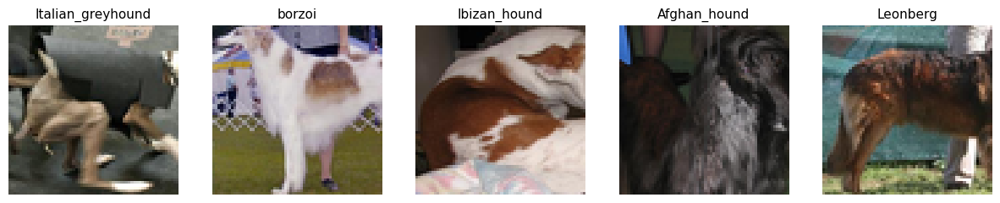

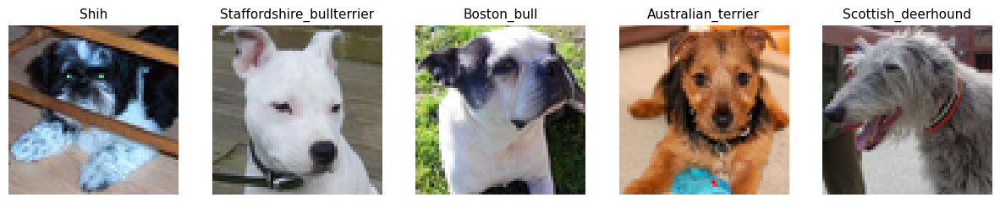

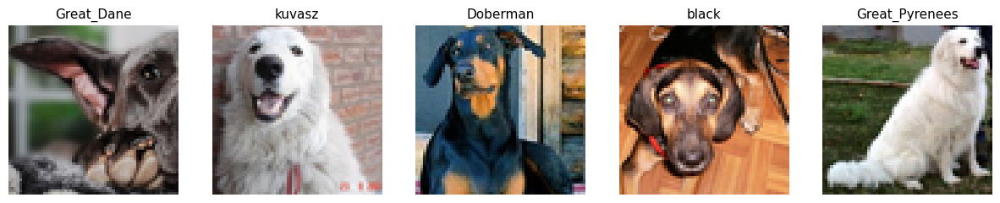

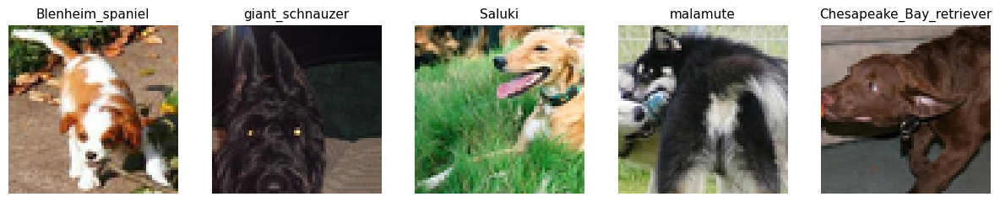

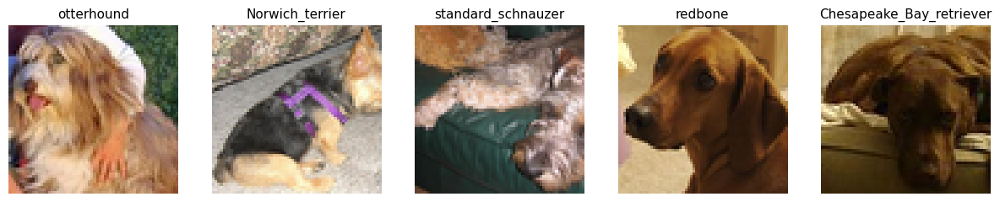

In [3]:


idin = 0
name = []
images = np.zeros((25000, 64, 64, 3))

if dogsonly:
    for breed in breeds:
        for dog in os.listdir(path + "Annotation/Annotation/" + breed):
            try:
                img = Image.open(path + "all-dogs/all-dogs/" + dog + ".jpg")
            except:
                continue

            tree = ET.parse(path + "Annotation/Annotation/" + breed + "/" + dog)
            root = tree.getroot()
            objects = root.findall("object")

            for x in objects:
                bndbox = x.find("bndbox")
                xmin = int(bndbox.find("xmin").text)
                ymin = int(bndbox.find("ymin").text)
                xmax = int(bndbox.find("xmax").text)
                ymax = int(bndbox.find("ymax").text)
                w = np.min((xmax - xmin, ymax - ymin))
                img2 = img.crop((xmin, ymin, xmin + w, ymin + w))
                img2 = img2.resize((64, 64), Image.ANTIALIAS)
                images[idin, :, :, :] = np.asarray(img2)
                name.append(breed)
                idin += 1

    idx = np.arange(idin)
    np.random.shuffle(idx)
    images = images[idx, :, :, :]
    name = np.array(name)[idx]

else:
    m = np.random.choice(np.arange(20579), 10000)
    for k in range(len(m)):
        img = Image.open(path + "all-dogs/all-dogs/" + image[m[k]])
        w = img.size[0]
        h = img.size[1]
        sz = np.min((w, h))
        a = 0
        b = 0
        if w < h:
            b = (h - sz) // 2
        else:
            a = (w - sz) // 2
        img = img.crop((a, b, sz + a, sz + b))
        img = img.resize((64, 64), Image.ANTIALIAS)
        images[idin, :, :, :] = np.asarray(img)
        name.append(image[m[k]])
        if idin % 1000 == 0:
            print(idin)
        idin += 1

x = np.random.randint(0, idin, 25)

for k in range(5):
    plt.figure(figsize=(15, 3))
    for j in range(5):
        plt.subplot(1, 5, j + 1)
        img = Image.fromarray(images[x[k * 5 + j], :, :, :].astype('uint8'))
        plt.axis('off')
        if not dogsonly:
            plt.title(name[x[k * 5 + j]], fontsize=11)
        else:
            plt.title(name[x[k * 5 + j]].split('-')[1], fontsize=11)
        plt.imshow(img)

plt.show()

# Create Discriminator

In [4]:
from keras.layers import Input, Dense, Reshape, Conv2D, Flatten, concatenate
from keras.models import Model


dog = Input((12288,))
dogname = Input((10000,))
b = Dense(12288, activation="sigmoid")(dogname)
b = Reshape((2, 12288, 1))(concatenate([dog, b]))
b = Conv2D(1, (2, 1), use_bias=False)(b)
discriminated = Flatten()(b)
discriminator = Model([dog, dogname], discriminated)

discriminator.get_layer('conv2d').trainable = False
discriminator.get_layer('conv2d').set_weights([np.array([[[[-1.0]]],[[[1.0]]]])])

discriminator.compile(optimizer='adam', loss='binary_crossentropy')
discriminator.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_layer         │ (None, 12288)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 12288)     │ 122,892,2… │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 24576)     │          0 │ input_layer[0][0… │
│ (Concatenate)       │                   │            │ dense[0][0]       │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape (Reshape)   │ (None, 2, 12288,  │          0 │ concatenate[0][0] │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 1, 12288,  │          2 │ reshape[0][0]     │
│                     │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten (Flatten)   │ (None, 12288)     │          0 │ conv2d[0][0]      │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 122,892,290 (468.80 MB)

 Trainable params: 122,892,288 (468.80 MB)

 Non-trainable params: 2 (8.00 B)

# Train Discriminator

In [5]:
from keras.callbacks import LearningRateScheduler

train_y=(images[: 10000,:,:,:]/255.).reshape((-1,12288))
train_x=np.zeros((10000,10000))
for i in range(10000):
    train_x[i,i]=1
zeros=np.zeros((10000,12288))
learning_rate=0.4
for k in range(5):
    annealer=LearningRateScheduler(lambda x: learning_rate)
    h=discriminator.fit([zeros,train_x],train_y,epochs=10,batch_size=64,callbacks=[annealer],verbose=1)
    print("Epoch",(k+1)*10,"/30-loss=",h.history["loss"][-1])
    if h.history["loss"][-1]<0.533:
        learning_rate=0.1
    

Epoch 1/10
  7/157 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - loss: 0.6865

I0000 00:00:1715628096.072195   25107 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1715628096.085096   25107 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


157/157 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - loss: 0.6833 - learning_rate: 0.4000
Epoch 2/10
  7/157 ━━━━━━━━━━━━━━━━━━━━ 2s 19ms/step - loss: 0.6187

W0000 00:00:1715628099.750950   25108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.6147 - learning_rate: 0.4000
Epoch 3/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5636 - learning_rate: 0.4000
Epoch 4/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5446 - learning_rate: 0.4000
Epoch 5/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5364 - learning_rate: 0.4000
Epoch 6/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5349 - learning_rate: 0.4000
Epoch 7/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5331 - learning_rate: 0.4000
Epoch 8/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5325 - learning_rate: 0.4000
Epoch 9/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5312 - learning_rate: 0.4000
Epoch 10/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5306 - learning_rate: 0.4000
Epoch 10 /30-loss= 0.5313894748687744
Epoch 1/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 0.5308 - learning_rate: 0.1000
Epoch 2/10
157/157 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step

In [6]:
del train_x, train_y, images

The discriminator retrieves dog images from its memory
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 190ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


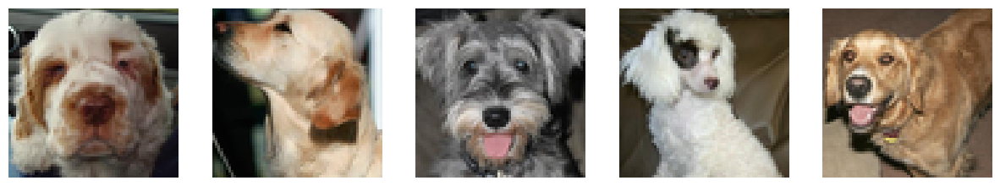

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


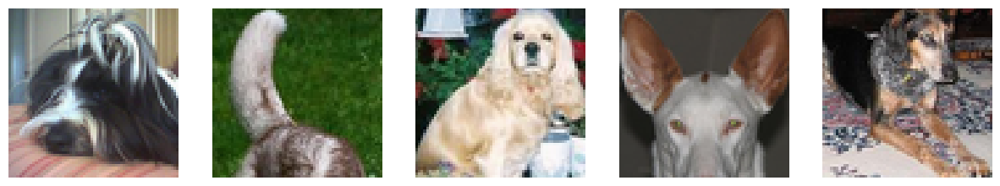

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


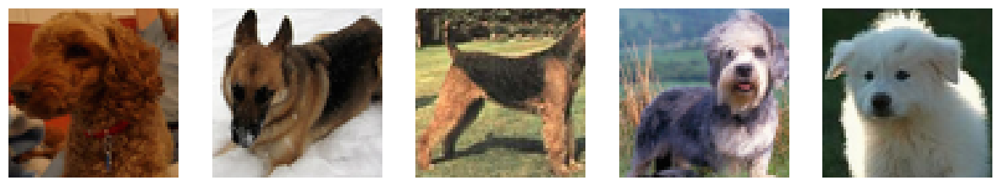

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


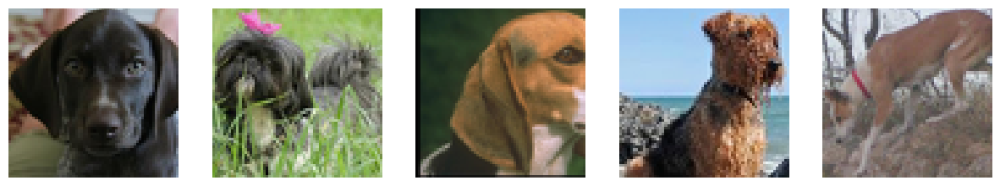

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


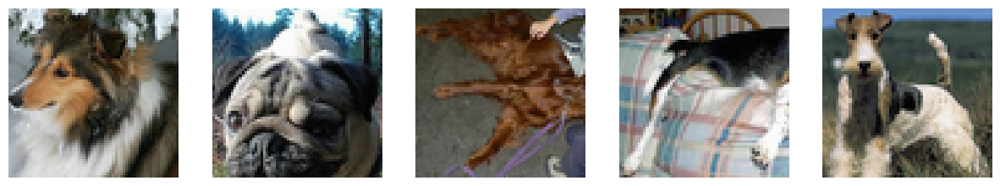

In [7]:
print('The discriminator retrieves dog images from its memory')    
for k in range(5):
    plt.figure(figsize=(15,3))
    for j in range(5):
        xx = np.zeros((10000))
        xx[np.random.randint(10000)] = 1
        plt.subplot(1,5,j+1)
        img = discriminator.predict([zeros[0,:].reshape((-1,12288)),xx.reshape((-1,10000))]).reshape((-1,64,64,3))
        img = Image.fromarray( (255*img).astype('uint8').reshape((64,64,3)))
        plt.axis('off')
        plt.imshow(img)
    plt.show()

# Create Generator

In [8]:
badmemory = True

if badmemory:
    seed = Input((10000,))
    x = Dense(2048, activation='elu')(seed)
    x = Reshape((8,8,32))(x)
    x = Conv2D(128, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(64, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(32, (3, 3), activation='elu', padding='same')(x)
    x = UpSampling2D((2, 2))(x)
    x = Conv2D(3, (3, 3), activation='linear', padding='same')(x)
    generated = Flatten()(x)
else:
    seed = Input((10000,))
    generated = Dense(12288, activation='linear')(seed)

generator = Model(seed, [generated,Reshape((10000,))(seed)])


generator.summary()




Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 2048)      │ 20,482,048 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_1 (Reshape) │ (None, 8, 8, 32)  │          0 │ dense_1[0][0]     │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 8, 8, 128) │     36,992 │ reshape_1[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d       │ (None, 16, 16,    │          0 │ conv2d_1[0][0]    │
│ (UpSampling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 16, 16,    │     73,792 │ up_sampling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_1     │ (None, 32, 32,    │          0 │ conv2d_2[0][0]    │
│ (UpSampling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 32, 32,    │     18,464 │ up_sampling2d_1[… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ up_sampling2d_2     │ (None, 64, 64,    │          0 │ conv2d_3[0][0]    │
│ (UpSampling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 64, 64, 3) │        867 │ up_sampling2d_2[… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ flatten_1 (Flatten) │ (None, 12288)     │          0 │ conv2d_4[0][0]    │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ reshape_2 (Reshape) │ (None, 10000)     │          0 │ input_layer_2[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 20,612,163 (78.63 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 0 (0.00 B)

# Create GAN 

In [9]:
discriminator.trainable = False
gan_input = Input(shape=(10000,))
x = generator(gan_input)
gan_output = discriminator(x)
gan = Model(gan_input, gan_output)
gan.get_layer('functional_1').get_layer('conv2d').set_weights([np.array([[[[-1.0]]],[[[1.0]]]])])
gan.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')
gan.summary()

Model: "functional_5"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 10000)     │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_3        │ [(None, 12288),   │ 20,612,163 │ input_layer_3[0]… │
│ (Functional)        │ (None, 10000)]    │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ functional_1        │ (None, 12288)     │ 122,892,2… │ functional_3[0][… │
│ (Functional)        │                   │            │ functional_3[0][… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 143,504,453 (547.43 MB)

 Trainable params: 20,612,163 (78.63 MB)

 Non-trainable params: 122,892,290 (468.80 MB)

# Training

 5/40 ━━━━━━━━━━━━━━━━━━━━ 1s 37ms/step - loss: 0.3188

W0000 00:00:1715628275.184657   25108 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


40/40 ━━━━━━━━━━━━━━━━━━━━ 9s 38ms/step - loss: 0.1875 - learning_rate: 0.0050
Epoch 1/50 - loss = 0.11862660944461823
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.1531 - learning_rate: 0.0050
Epoch 2/50 - loss = 0.0985482856631279
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0371 - learning_rate: 0.0050
Epoch 3/50 - loss = 0.034540675580501556
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0238 - learning_rate: 0.0050
Epoch 4/50 - loss = 0.023346848785877228
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0191 - learning_rate: 0.0050
Epoch 5/50 - loss = 0.018832489848136902
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━

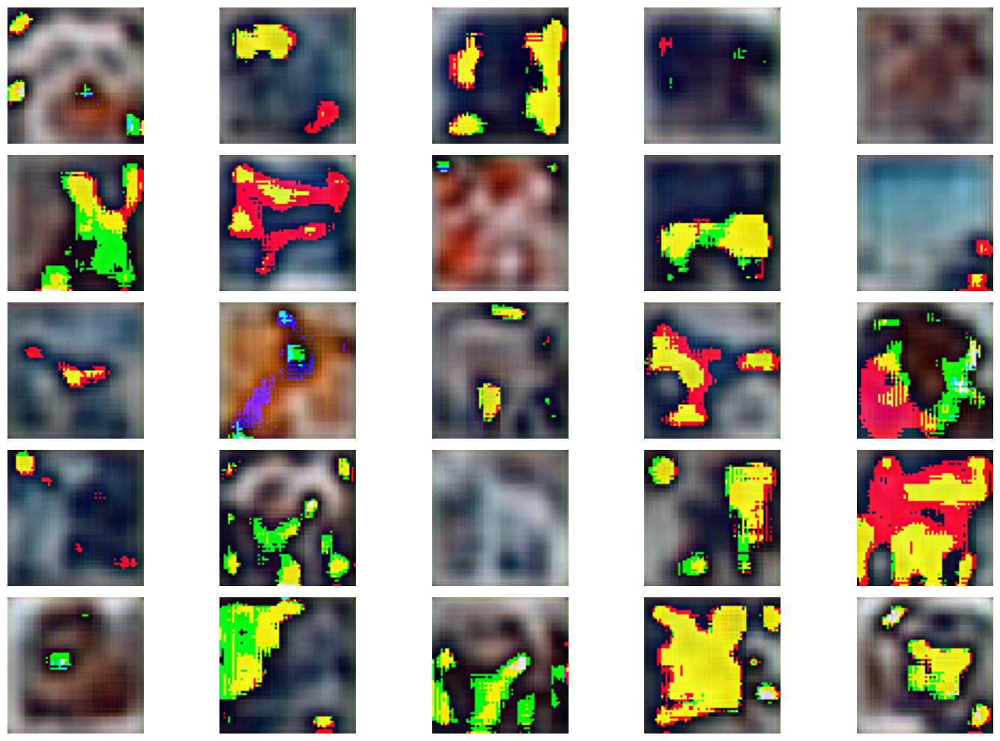

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0160 - learning_rate: 0.0050
Epoch 6/50 - loss = 0.015935059636831284
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0143 - learning_rate: 0.0050
Epoch 7/50 - loss = 0.014156571589410305
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0130 - learning_rate: 0.0050
Epoch 8/50 - loss = 0.012881145812571049
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0122 - learning_rate: 0.0050
Epoch 9/50 - loss = 0.012096833437681198
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0116 - learning_rate: 0.0050
Epoch 10/50 - loss = 0.011378761380910873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━

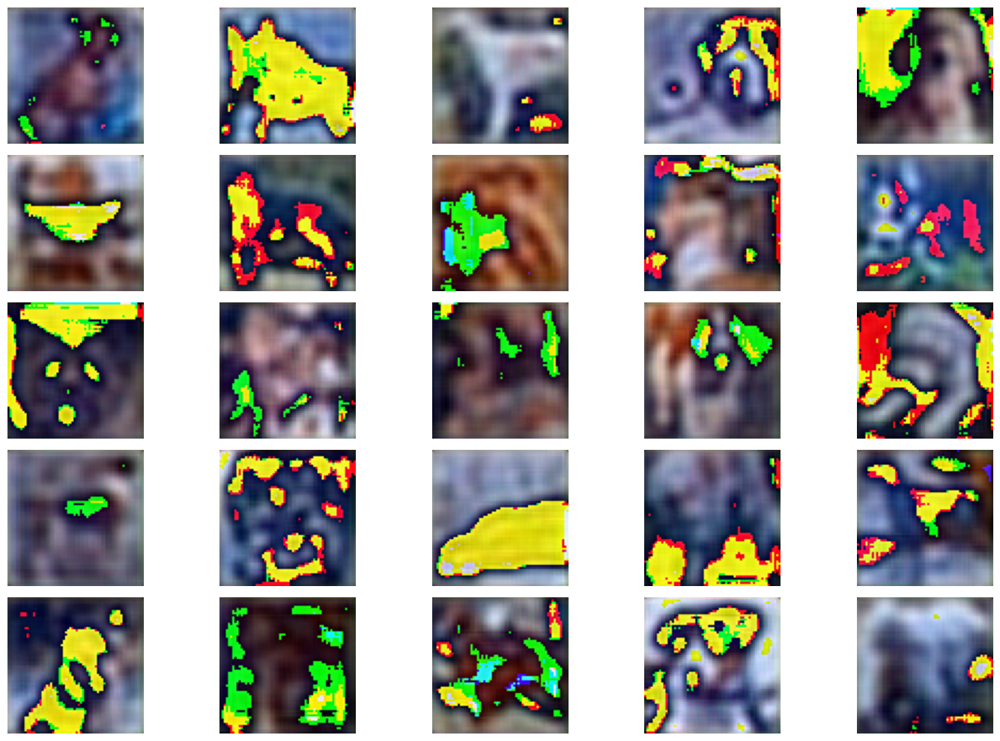

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0111 - learning_rate: 0.0050
Epoch 11/50 - loss = 0.010992391034960747
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0107 - learning_rate: 0.0050
Epoch 12/50 - loss = 0.010450737550854683
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0100 - learning_rate: 0.0050
Epoch 13/50 - loss = 0.009739293716847897
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0093 - learning_rate: 0.0050
Epoch 14/50 - loss = 0.009261852130293846
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0086 - learning_rate: 0.0050
Epoch 15/50 - loss = 0.008666209876537323
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━

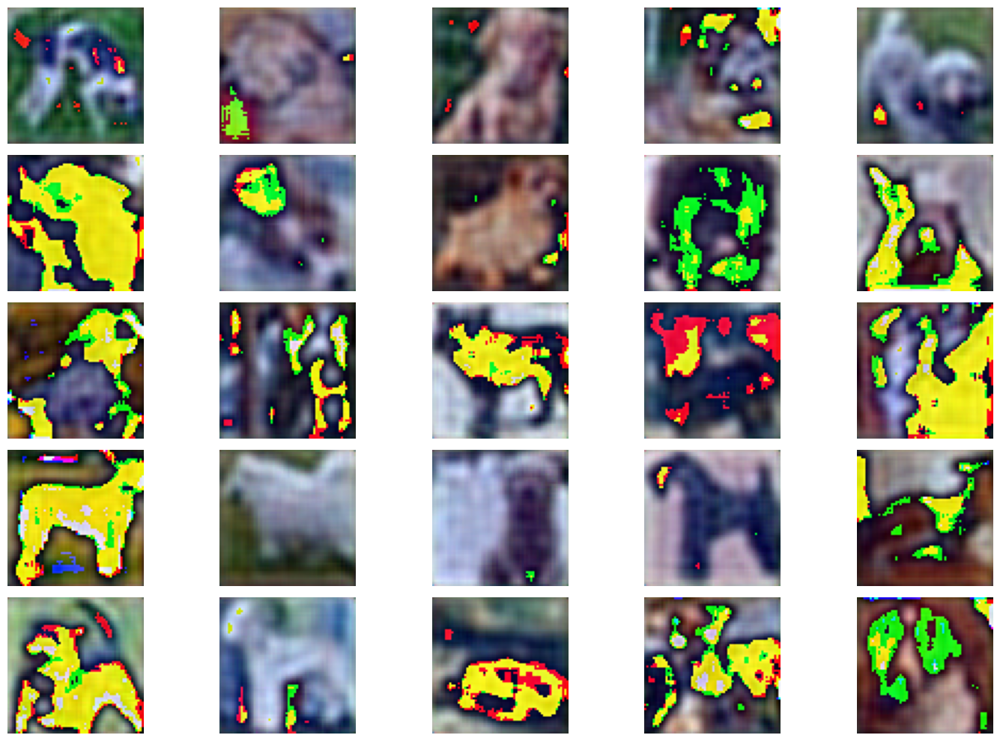

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0081 - learning_rate: 0.0050
Epoch 16/50 - loss = 0.008162028156220913
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0078 - learning_rate: 0.0050
Epoch 17/50 - loss = 0.007789907976984978
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0075 - learning_rate: 0.0050
Epoch 18/50 - loss = 0.0075204637832939625
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0073 - learning_rate: 0.0050
Epoch 19/50 - loss = 0.0073232795111835
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0070 - learning_rate: 0.0050
Epoch 20/50 - loss = 0.007062701508402824
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━

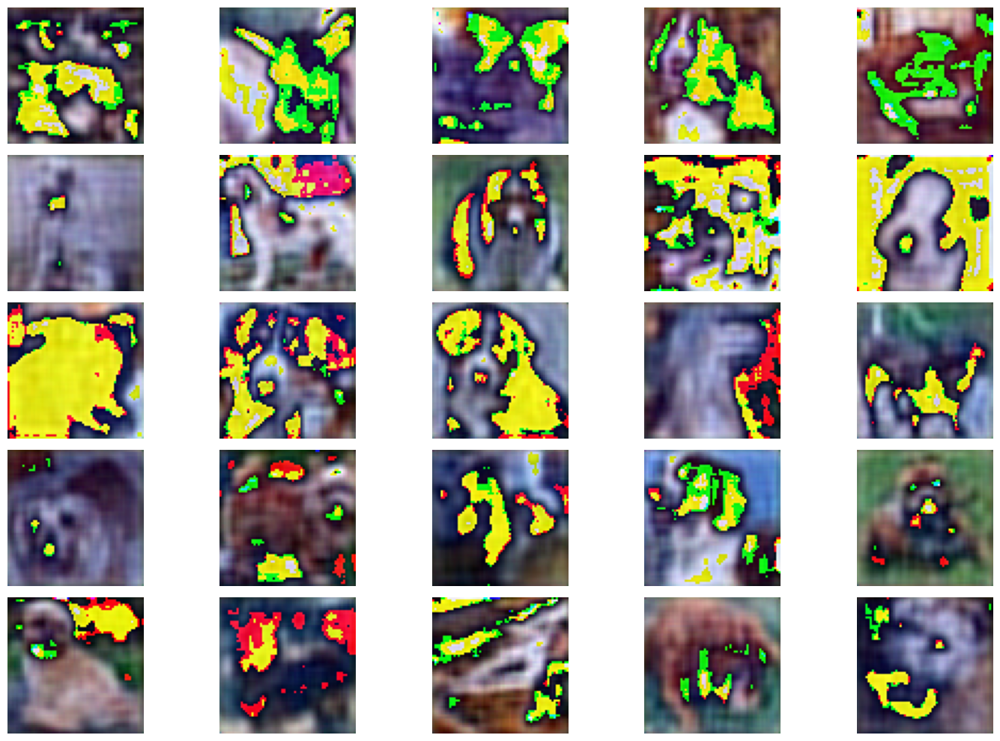

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0067 - learning_rate: 0.0050
Epoch 21/50 - loss = 0.006806321907788515
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0065 - learning_rate: 0.0050
Epoch 22/50 - loss = 0.00657475832849741
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0064 - learning_rate: 0.0050
Epoch 23/50 - loss = 0.006432885769754648
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0062 - learning_rate: 0.0050
Epoch 24/50 - loss = 0.006288607604801655
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0060 - learning_rate: 0.0050
Epoch 25/50 - loss = 0.0061063640750944614
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━

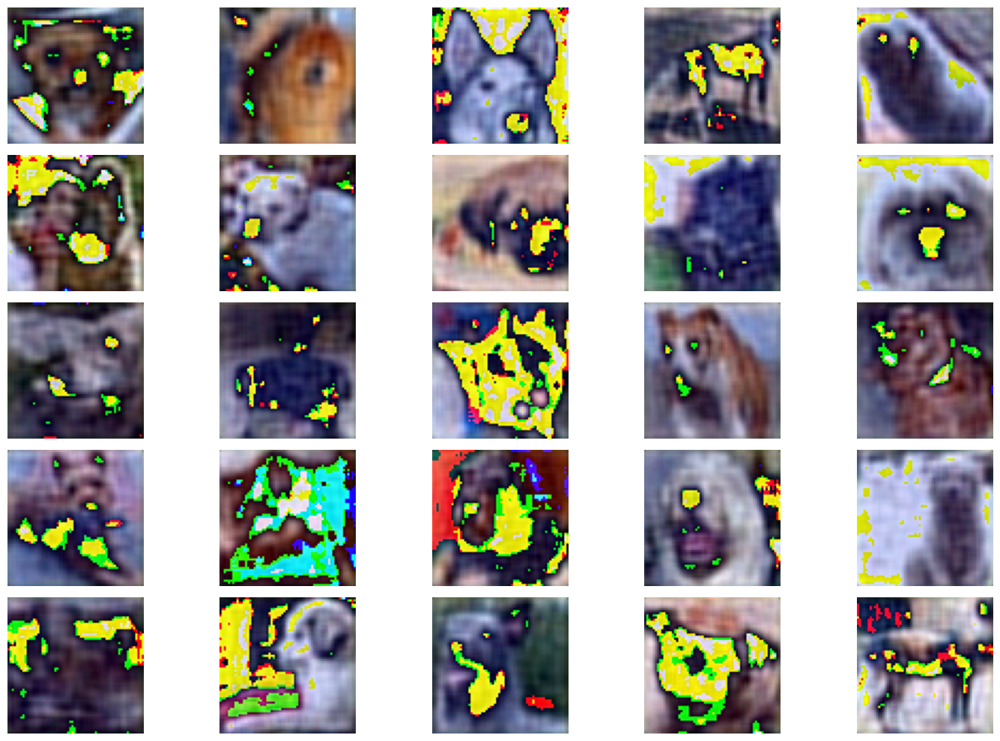

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0059 - learning_rate: 0.0050
Epoch 26/50 - loss = 0.005993540398776531
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0057 - learning_rate: 0.0050
Epoch 27/50 - loss = 0.005873460788279772
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0057 - learning_rate: 0.0050
Epoch 28/50 - loss = 0.005810643546283245
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0056 - learning_rate: 0.0050
Epoch 29/50 - loss = 0.005637594033032656
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0054 - learning_rate: 0.0050
Epoch 30/50 - loss = 0.005484359804540873
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━

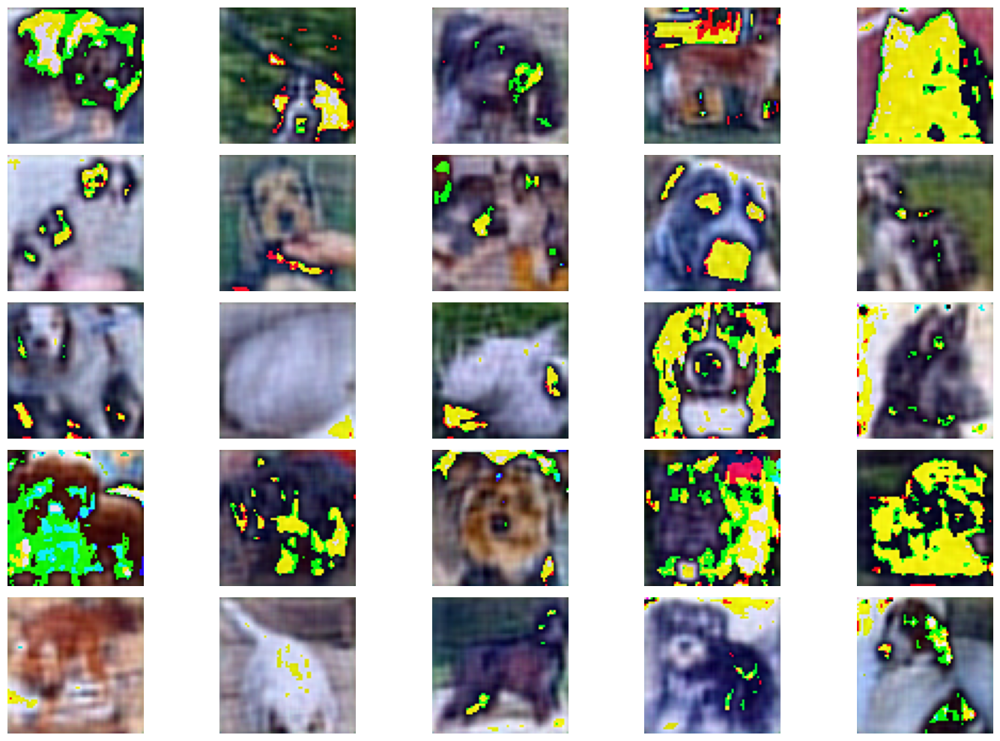

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0051 - learning_rate: 0.0050
Epoch 31/50 - loss = 0.005254438612610102
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0052 - learning_rate: 0.0050
Epoch 32/50 - loss = 0.005171464290469885
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0050 - learning_rate: 0.0050
Epoch 33/50 - loss = 0.005046866834163666
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0047 - learning_rate: 0.0050
Epoch 34/50 - loss = 0.004822374787181616
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0046 - learning_rate: 0.0050
Epoch 35/50 - loss = 0.004671287257224321
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━

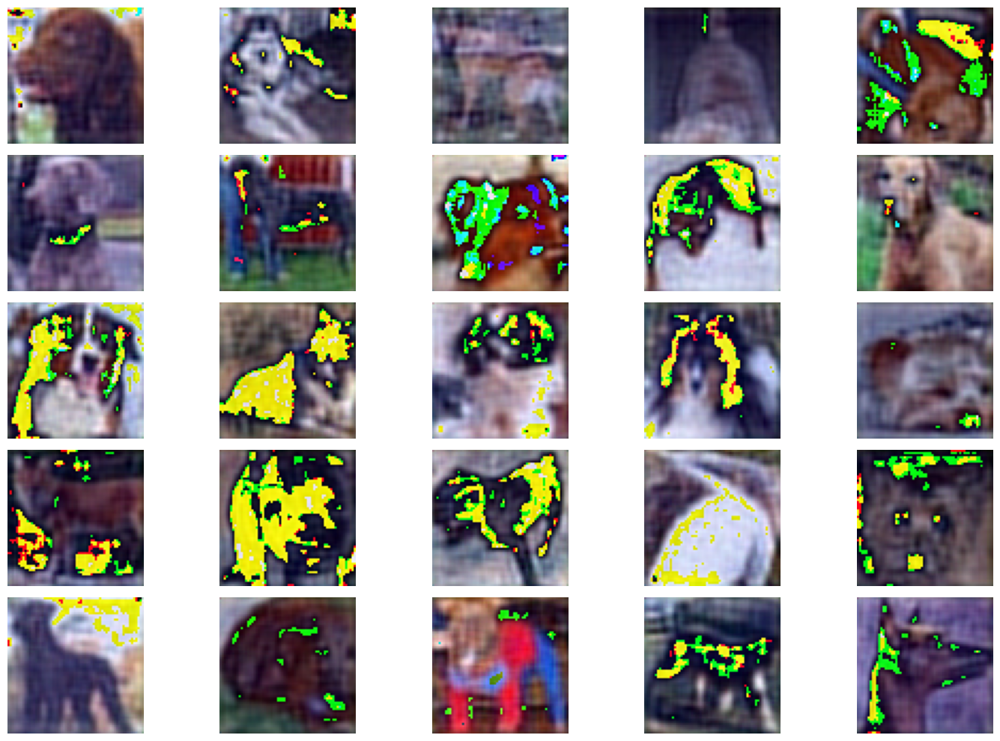

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0046 - learning_rate: 0.0050
Epoch 36/50 - loss = 0.0046863434836268425
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0047 - learning_rate: 0.0050
Epoch 37/50 - loss = 0.004757334012538195
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0046 - learning_rate: 0.0050
Epoch 38/50 - loss = 0.004603971261531115
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0045 - learning_rate: 0.0050
Epoch 39/50 - loss = 0.004508977755904198
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0043 - learning_rate: 0.0050
Epoch 40/50 - loss = 0.004350842908024788
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━

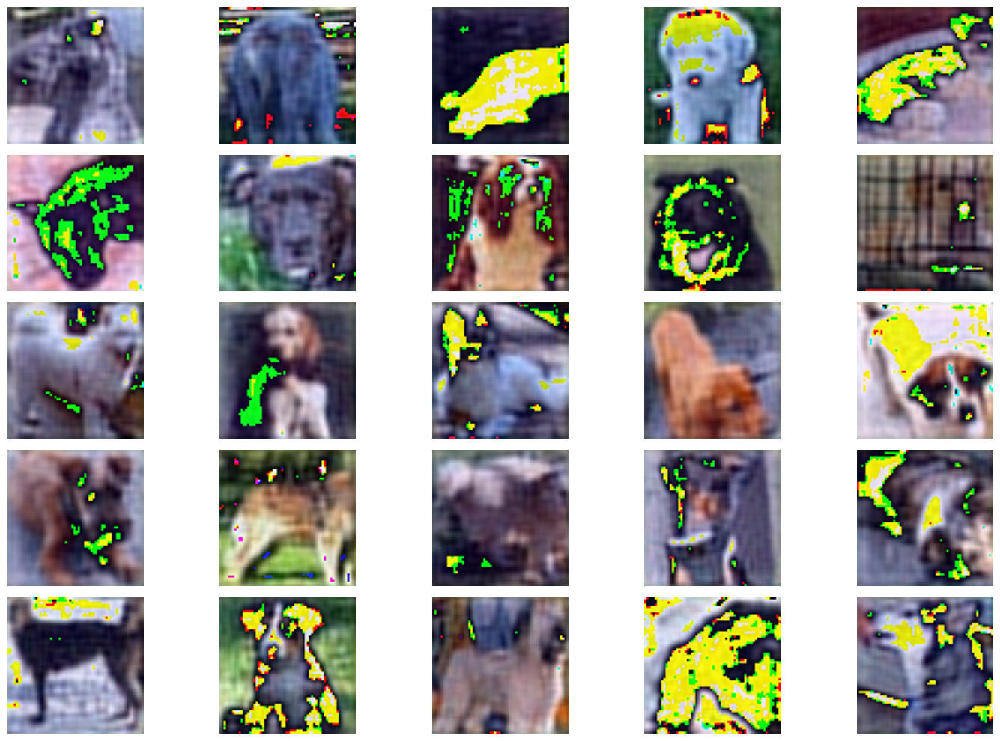

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0043 - learning_rate: 0.0050
Epoch 41/50 - loss = 0.004293239209800959
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0042 - learning_rate: 0.0050
Epoch 42/50 - loss = 0.00418627867475152
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0040 - learning_rate: 0.0050
Epoch 43/50 - loss = 0.004050983116030693
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 44/50 - loss = 0.003963420633226633
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 45/50 - loss = 0.003921544644981623
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━

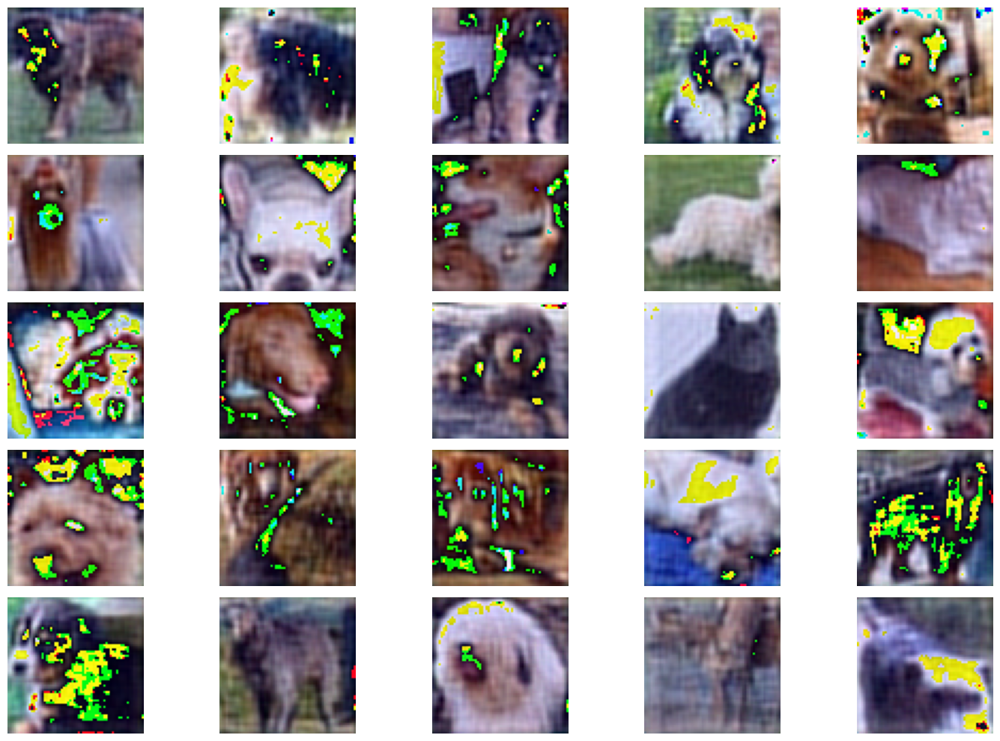

40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 46/50 - loss = 0.003980459179729223
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 38ms/step - loss: 0.0040 - learning_rate: 0.0050
Epoch 47/50 - loss = 0.004058550111949444
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 48/50 - loss = 0.0039649647660553455
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 49/50 - loss = 0.003936699125915766
40/40 ━━━━━━━━━━━━━━━━━━━━ 2s 37ms/step - loss: 0.0039 - learning_rate: 0.0050
Epoch 50/50 - loss = 0.0039554862305521965
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━

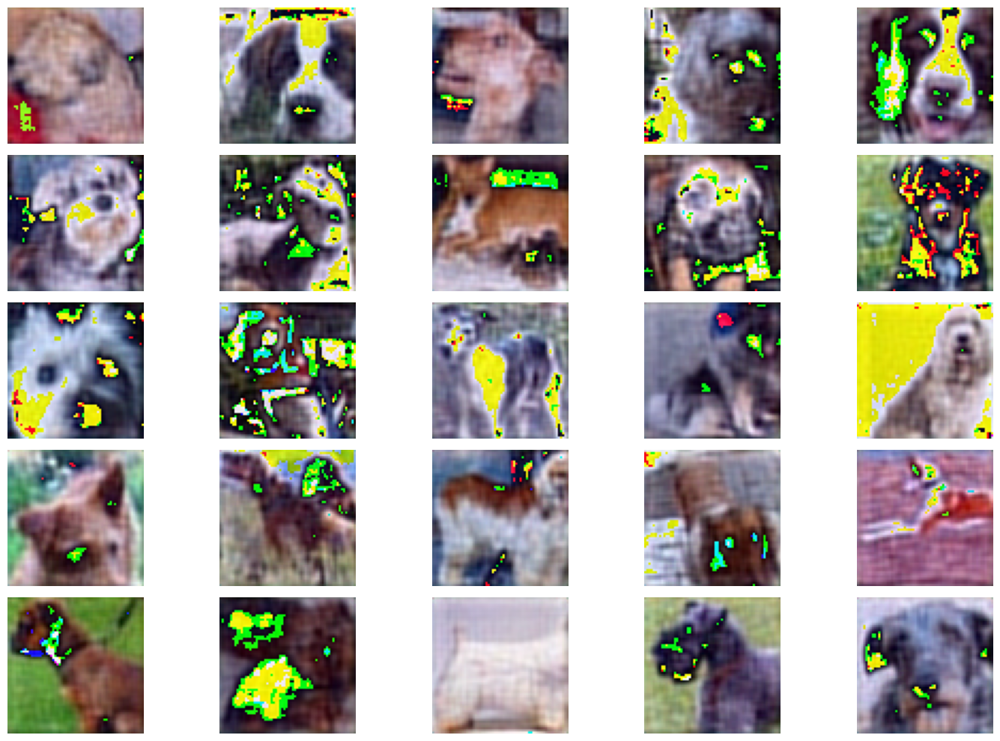

In [10]:
train = np.zeros((10000, 10000))
for i in range(10000):
    train[i, i] = 1

zeros = np.zeros((10000, 12288))

epochs = 50
batch_size = 250
lr = 0.005

losses = []  # List to store the losses
epoch_list = []  # List to store the epoch numbers

for epoch in range(1, epochs + 1):
    annealer = LearningRateScheduler(lambda x: lr)
    h = gan.fit(train, zeros, epochs=1, batch_size=batch_size, callbacks=[annealer], verbose=1)

    epoch_loss = h.history['loss'][0]
    losses.append(epoch_loss)
    epoch_list.append(epoch)

    print(f'Epoch {epoch}/{epochs} - loss = {epoch_loss}')

    if epoch % 5 == 0:
        plt.figure(figsize=(15,10))
        for j in range(25):
            xx = np.zeros((10000))
            xx[np.random.randint(10000)] = 1
            plt.subplot(5, 5, j + 1)
            img = generator.predict(xx.reshape((-1, 10000)))[0].reshape((-1, 64, 64, 3))
            img = Image.fromarray((img * 255).astype('uint8').reshape((64, 64, 3)))
            plt.axis('off')
            plt.imshow(img)
        plt.tight_layout()
        plt.show()




/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/opt/conda/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


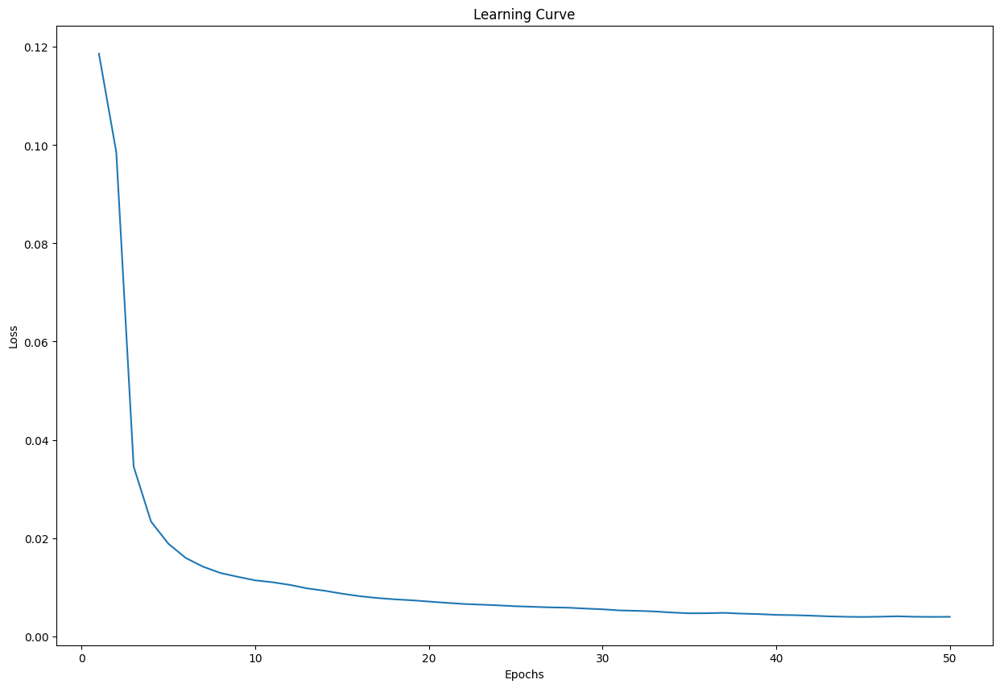

In [11]:
import seaborn as sns
plt.figure(figsize=(15, 10))
ax = sns.lineplot(x=epoch_list, y=losses)
ax.set(xlabel="Epochs", ylabel="Loss")
ax.set_title("Learning Curve")
plt.show()


# Generated Images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


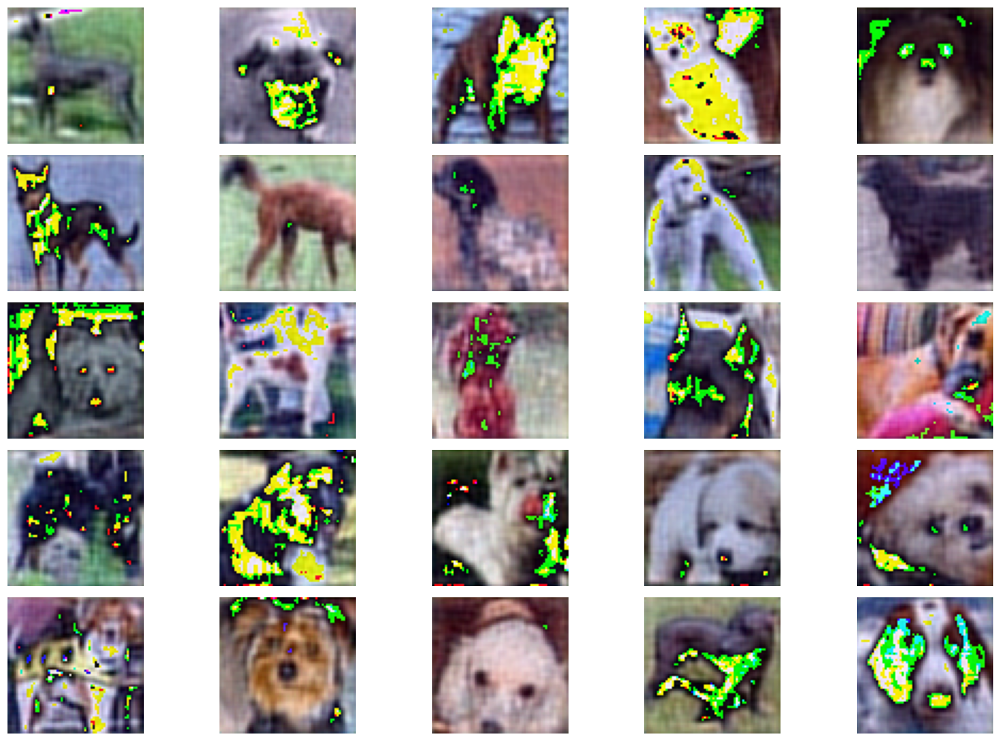

In [12]:


num_images = 25

plt.figure(figsize=(15, 10))
for j in range(num_images):
    xx = np.zeros((10000))
    xx[np.random.randint(10000)] = 1
    img = generator.predict(xx.reshape((1, 10000)))[0].reshape((64, 64, 3))
    img = Image.fromarray((img * 255).astype('uint8'))
    plt.subplot(5, 5, j + 1)
    plt.axis('off')
    plt.imshow(img)

plt.tight_layout()
plt.show()


# Inception Score

In [13]:



inception_model = InceptionV3(include_top=False, pooling='avg', input_shape=(299, 299, 3))

def get_inception_score(images, batch_size=32, splits=10):
    processed_images = preprocess_input(images)
    scores = []
    for i in range(splits):
        batch = processed_images[i * batch_size:(i + 1) * batch_size]
        batch_scores = inception_model.predict(batch)
        kl_score = np.mean(np.exp(np.mean(np.log(batch_scores), axis=0)))
        scores.append(np.exp(kl_score))
    inception_score = np.mean(scores)
    return inception_score

from tensorflow.keras.preprocessing.image import img_to_array, array_to_img

def generate_images(model, num_images, seed=None):
    if seed is None:
        seed = np.random.normal(size=(num_images, 10000))
    else:
        np.random.seed(seed)
        seed = np.random.normal(size=(num_images, 10000))
    generated_images = model.predict(seed)
    generated_images = generated_images[0].reshape((-1, 64, 64, 3))
    resized_images = np.zeros((num_images, 299, 299, 3), dtype=np.uint8)
    for i in range(num_images):
        img = array_to_img(generated_images[i])
        img = img.resize((299, 299), resample=Image.BICUBIC)
        resized_images[i] = img_to_array(img)
    return resized_images

generated_images = generate_images(generator, num_images=10000)
inception_score = get_inception_score(generated_images)
print(f'Inception Score: {inception_score}')

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 14s 14s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step


/tmp/ipykernel_25056/3034095007.py:9: RuntimeWarning: divide by zero encountered in log
  kl_score = np.mean(np.exp(np.mean(np.log(batch_scores), axis=0)))


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
Inception Score: 1.1696652173995972


# Fréchet Inception Distance (FID)

In [14]:
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.preprocessing import image as keras_image
from scipy.linalg import sqrtm
import numpy as np
import os

def calculate_fid(real_images_dir, generated_images, batch_size=8):
    def preprocess_images(image_paths):
        images = []
        for img_path in image_paths:
            img = keras_image.load_img(img_path, target_size=(150, 150))  # Resize to (150, 150)
            img = keras_image.img_to_array(img)
            img = preprocess_input(img)
            images.append(img)
        return np.array(images)

    inception_model = InceptionV3(include_top=False, pooling='avg')
    
    real_images_paths = [os.path.join(real_images_dir, filename) for filename in os.listdir(real_images_dir)]
    real_images = preprocess_images(real_images_paths)
    
    real_activations = inception_model.predict(real_images, batch_size=batch_size)
    generated_activations = inception_model.predict(generated_images, batch_size=batch_size)
    
    mu_real = np.mean(real_activations, axis=0)
    mu_generated = np.mean(generated_activations, axis=0)
    sigma_real = np.cov(real_activations, rowvar=False)
    sigma_generated = np.cov(generated_activations, rowvar=False)
    
    sqdiff = np.sum((mu_real - mu_generated) ** 2)
    covprod = sigma_real.dot(sigma_generated)
    
    fid = sqdiff + np.trace(sigma_real + sigma_generated - 2 * sqrtm(covprod))
    return fid

real_images_dir = "/kaggle/input/generative-dog-images/all-dogs/all-dogs"
num_generated_images = 2000


generated_images = generator.predict(np.random.normal(size=(num_generated_images, 10000)))[0]  # Only take generated images
generated_images_reshaped = generated_images.reshape((num_generated_images, 64, 64, 3))  # Reshape to (num_images, height, width, channels)


generated_images_resized = np.array([keras_image.array_to_img(img).resize((150, 150)) for img in generated_images_reshaped])
fid = calculate_fid(real_images_dir, generated_images_resized)
print(f'Fréchet Inception Distance (FID): {fid:.2f}')


63/63 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step
2573/2573 ━━━━━━━━━━━━━━━━━━━━ 48s 15ms/step
250/250 ━━━━━━━━━━━━━━━━━━━━ 9s 12ms/step
Fréchet Inception Distance (FID): 2041605.93-0.00j
